<a href="https://colab.research.google.com/github/King-of-Haskul/Machine-Learning-And-Data-Science/blob/main/Visualizing_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/Users/pc/Downloads/cats_and_dogs_small_2.h5')
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_21 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_23 (MaxPooling (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 15, 15, 128)      

Preprocessing a single image

In [ ]:
img_path = '/Users/pc/Downloads/cats_and_dog_small/test/cats/cat.1700.jpg'

from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150,150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255
img_tensor.shape

(1, 150, 150, 3)

Displaying the test picture

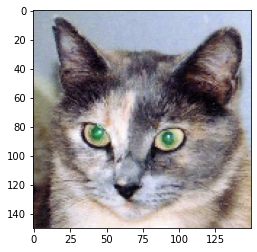

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

### Instantiang a model from an input tensor and a list of output tensors

In [ ]:
from tensorflow.keras import models

layer_outputs = [layer.output for layer in model.layers[:8]] #Extracts the outputs of the top eight layers
activation_model = models.Model(inputs=model.input, outputs = layer_outputs) #Creates a model that will return these outputs, given the model input

In [ ]:
activations = activation_model.predict(img_tensor) #Returns a list of eight Numpy arrays, one array per layer activation

In [ ]:
first_layer_activation = activations[0]
first_layer_activation.shape

(1, 148, 148, 32)

Visualizing the channels of the activation of the first layer of the original model:

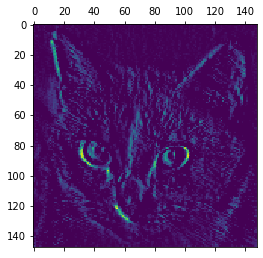

In [ ]:
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')

This channel appears to encode a diagonal edge

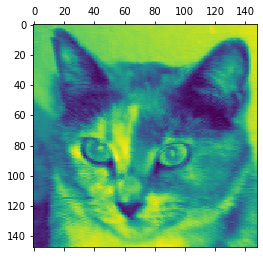

In [ ]:
plt.matshow(first_layer_activation[0, :, :, 7], cmap='viridis')

## Visualizing every channel in every intermediate activation

<ipython-input-37-c5101359bc23>:20: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


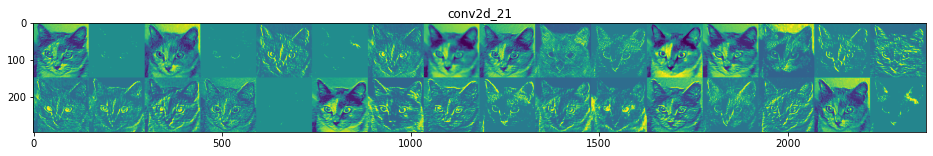

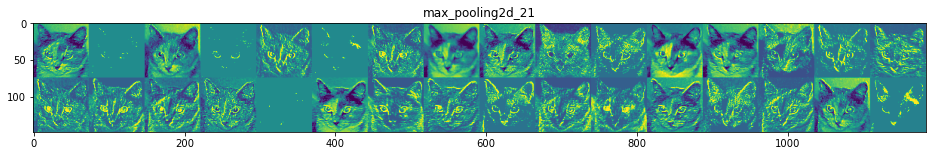

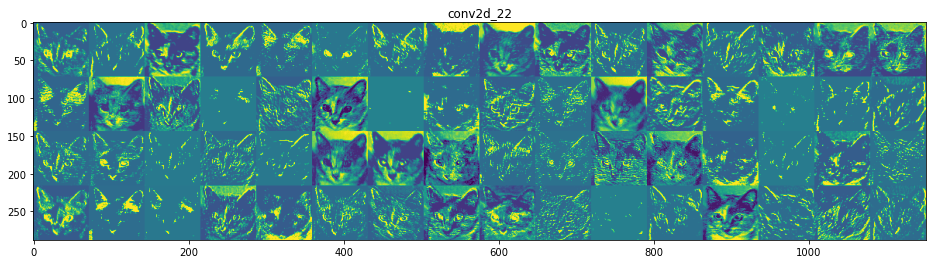

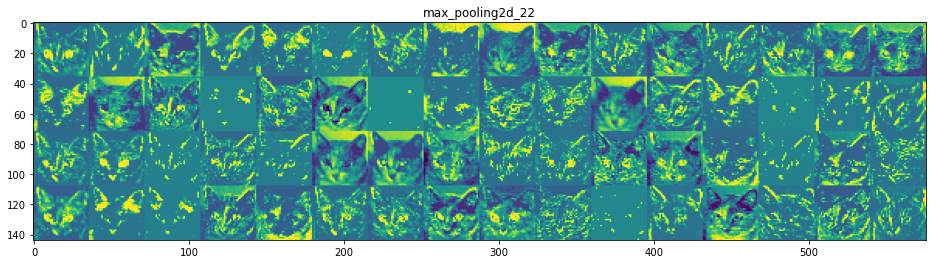

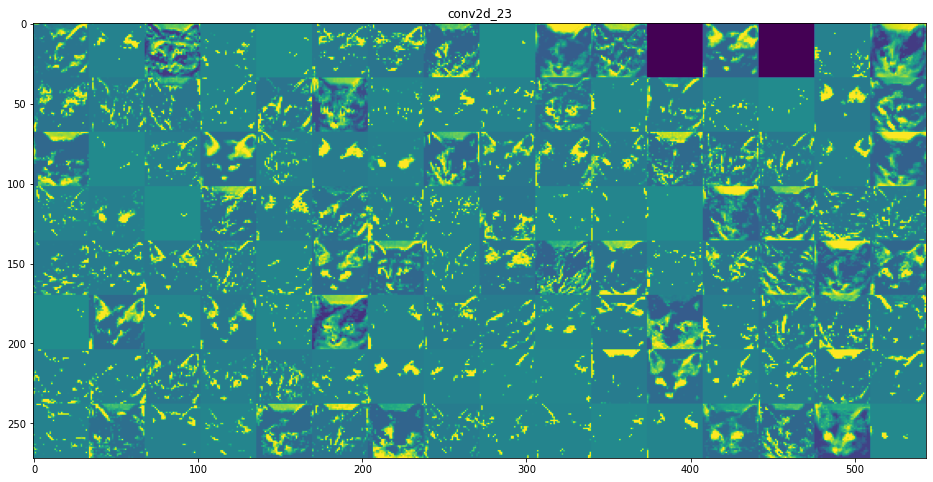

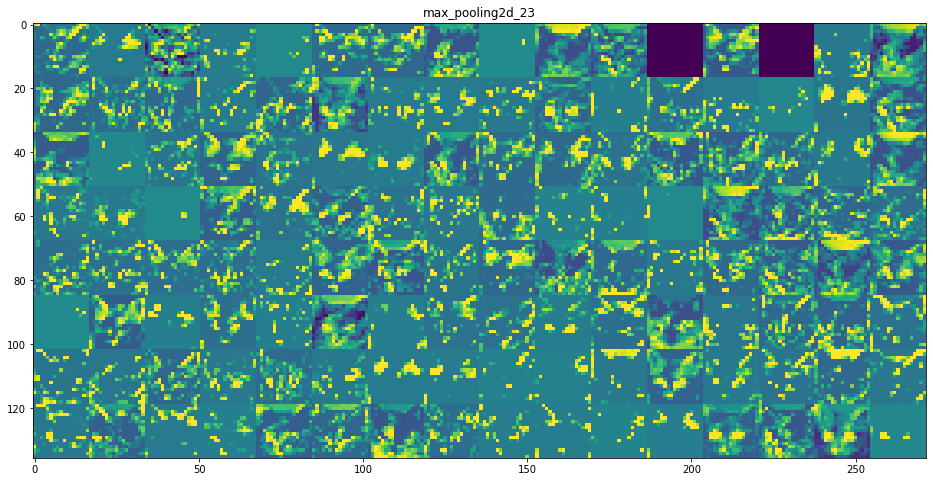

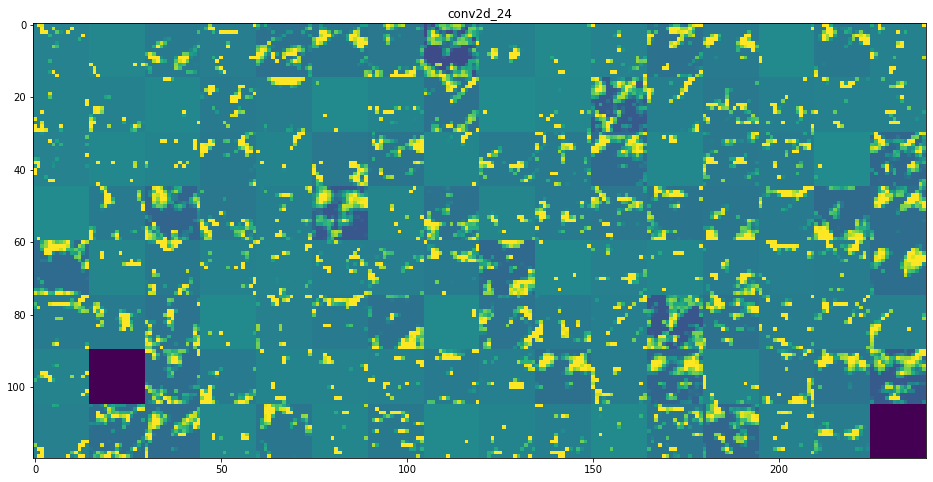

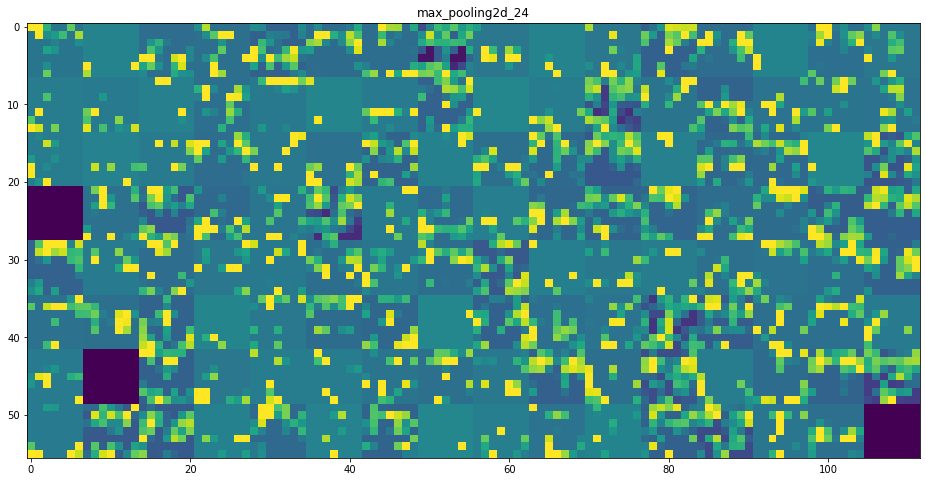

In [ ]:
layer_names = []   #Defining names of the layers, so we can have them as part of our plot
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):  #Displays the feature maps
    n_features = layer_activation.shape[-1]  #Number of features in the feature map
    #The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]
    
    n_rows = n_features // images_per_row  #Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_rows, size * images_per_row))
    
    for row in range(n_rows):
        for col in range(images_per_row):
            channel_image = layer_activation[0, :, :, row*images_per_row + col]
            #Post-processing the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            #Storing the channel_image in the display_grid
            display_grid[row*size : (row+1)*size, col*size : (col+1)*size] = channel_image
            
    scale = 1./size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

### Visualizing Convnet Filters (VGG16)

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()

model = VGG16(weights='imagenet', include_top=False)
layer_name = 'block3_conv1'
filter_index = 0

#### Function to generate Filter visualizations:

In [ ]:
def generate_pattern(layer_name, filter_index, size=150):
    #Building a loss function that maximizes the activation of the nth filter of the layer under consideration
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index]) #loss defined as the mean of the tensor

    #Obtaining the gradient of the loss with regard to the input
    grads = K.gradients(loss, model.input)[0] 
    #The call to gradients returns a list of tensors. Hence, we keep only the first element which is a tensor.

    #Gradient-normalization trick
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5) #Add 1e-5 before dividing to avoid accidentaly dividing by 0

    #Fetching Numpy output values given Numpy input values using keras backend.function
    iterate = K.function([model.input], [loss, grads])

    #Loss maxmization via stochastic gradient descent
    input_img_data = np.random.random((1,size, size, 3))*20 + 128.  #Starts from a gray image with some noise

    step = 1   #Magnitude of each gradient update
    for i in range(40):   #Runs gradient ascent for 40 steps
        loss_value, grads_value = iterate([input_img_data])   #Computes the loss value and gradient value
        input_img_data += grads_value * step   #Adjust the input image in the direction that maximizes the loss
        
    img = input_img_data[0]
    return deprocess_image(img)

#### Utility function to convert a tensor into a valid image:

In [ ]:
def deprocess_image(x):
    #Normalizing the tensor
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    
    #Clips to [0,1]
    x += 0.5
    x = np.clip(x, 0, 1)
    
    #Converts to an RGB array
    x *= 255
    x = np.clip(x,0,255).astype('uint8')
    
    return x

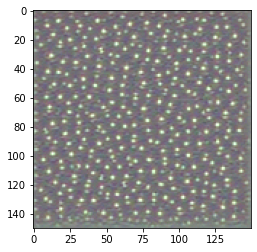

In [ ]:
plt.imshow(generate_pattern(layer_name, filter_index))

It seems that filter 0 in layer block3_conv1 is responsive to a polka-dot pattern

#### Generating a grid of all filter response patterns in a layer
We'll only look at the first 64 filters in each layer, and only look at the first layer of each convolution block (block1_conv1, block2_conv1, block3_conv1, block4_conv1, block5_conv1).

In [ ]:
def plot_filter_patterns(layer_name):
    size = 64  #Defining size of image
    margin = 5  #Defining the size of the margin 
    title = 'Filter patterns for layer '+layer_name
    
    results = np.zeros((8*size + 7*margin, 8*size + 7*margin, 3)) #Empty black image to store result
    
    for i in range(8):
        for j in range(8):
            filter_img = generate_pattern(layer_name, i + (j*8), size=size) #Generates the pattern
            #Putting the result in the square (i,j) of the results grid
            horizontal_start = i*size + i*margin
            horizontal_end = horizontal_start + size
            vertical_start = j*size + j*margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    plt.figure(figsize=(20,20))
    plt.title(title)
    plt.imshow(results.astype('uint8'))
    plt.show()

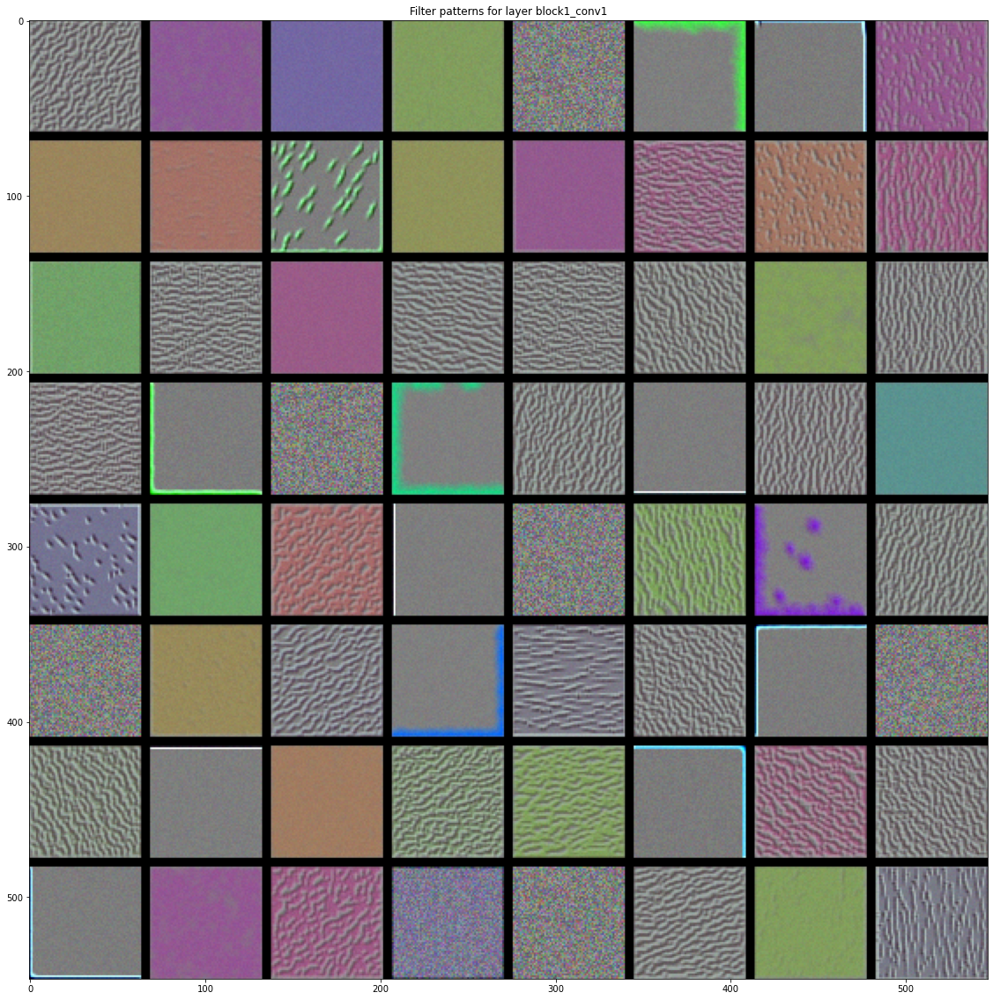

In [ ]:
layers = ('block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1')

plot_filter_patterns(layers[0])

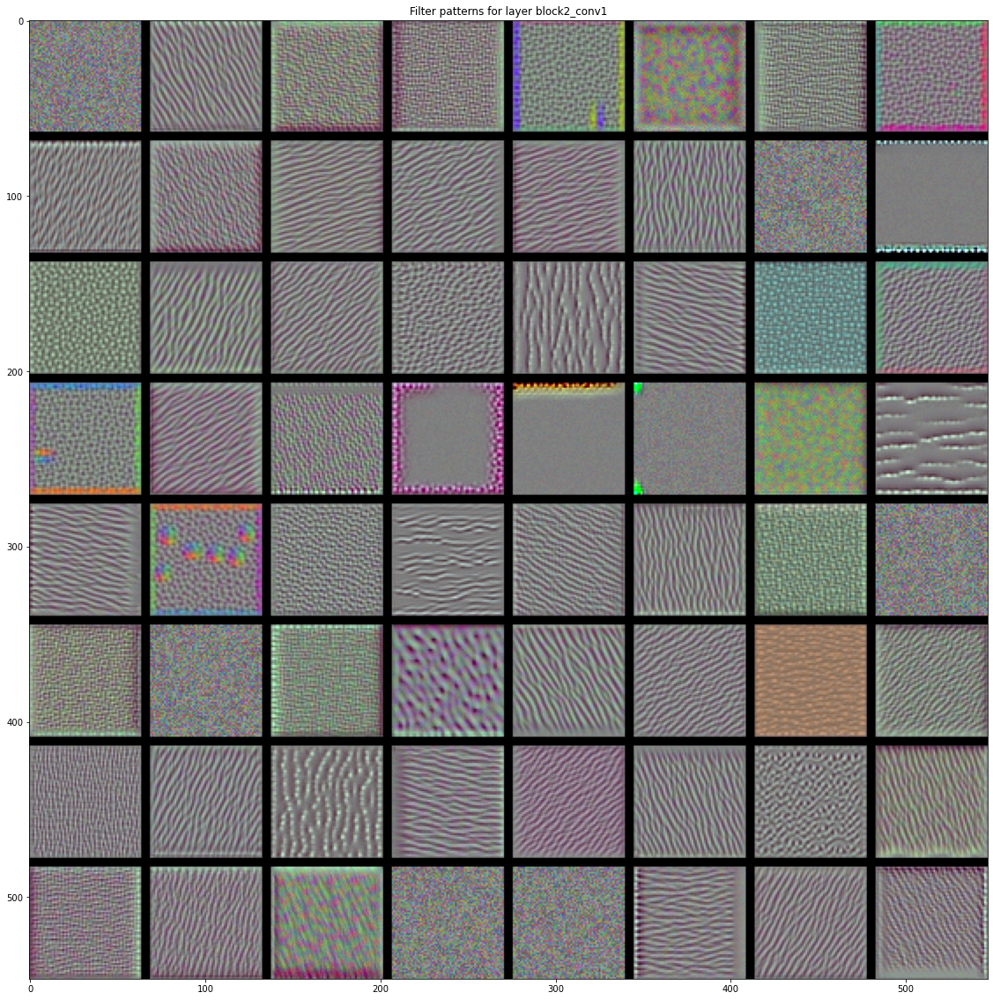

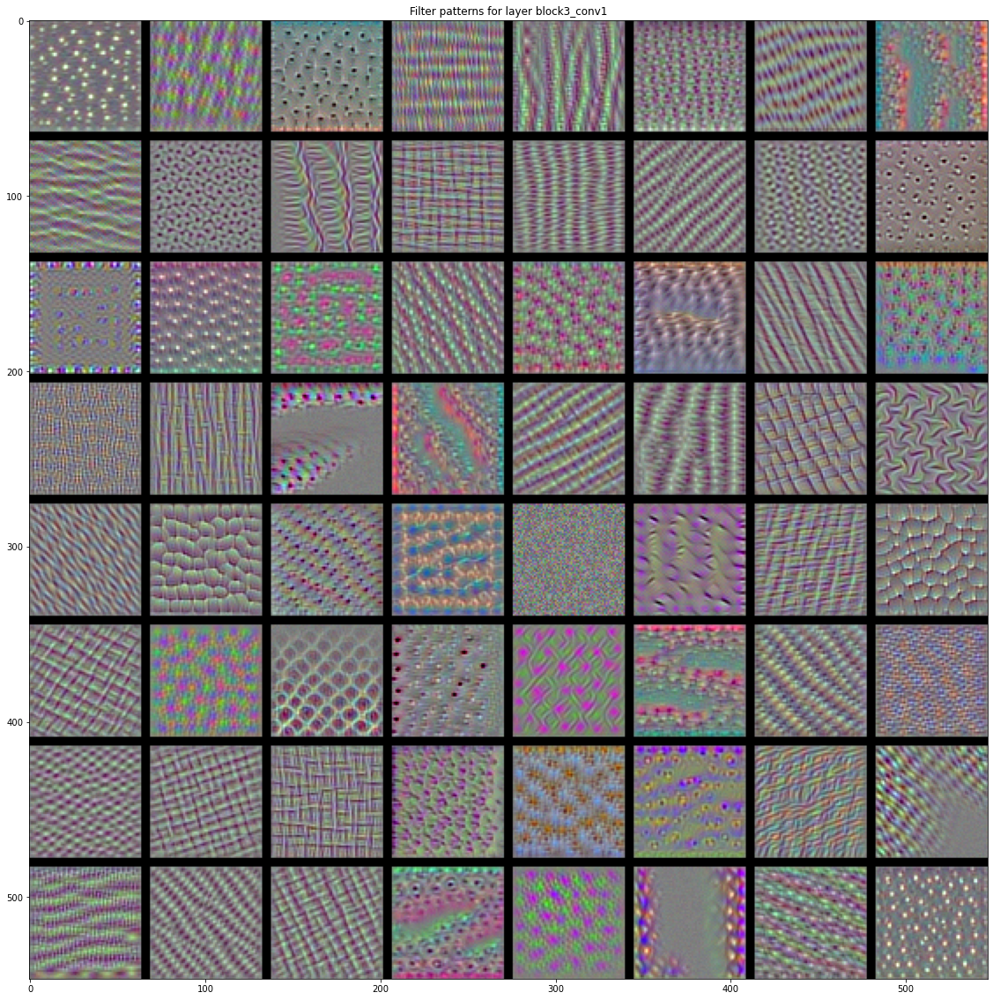

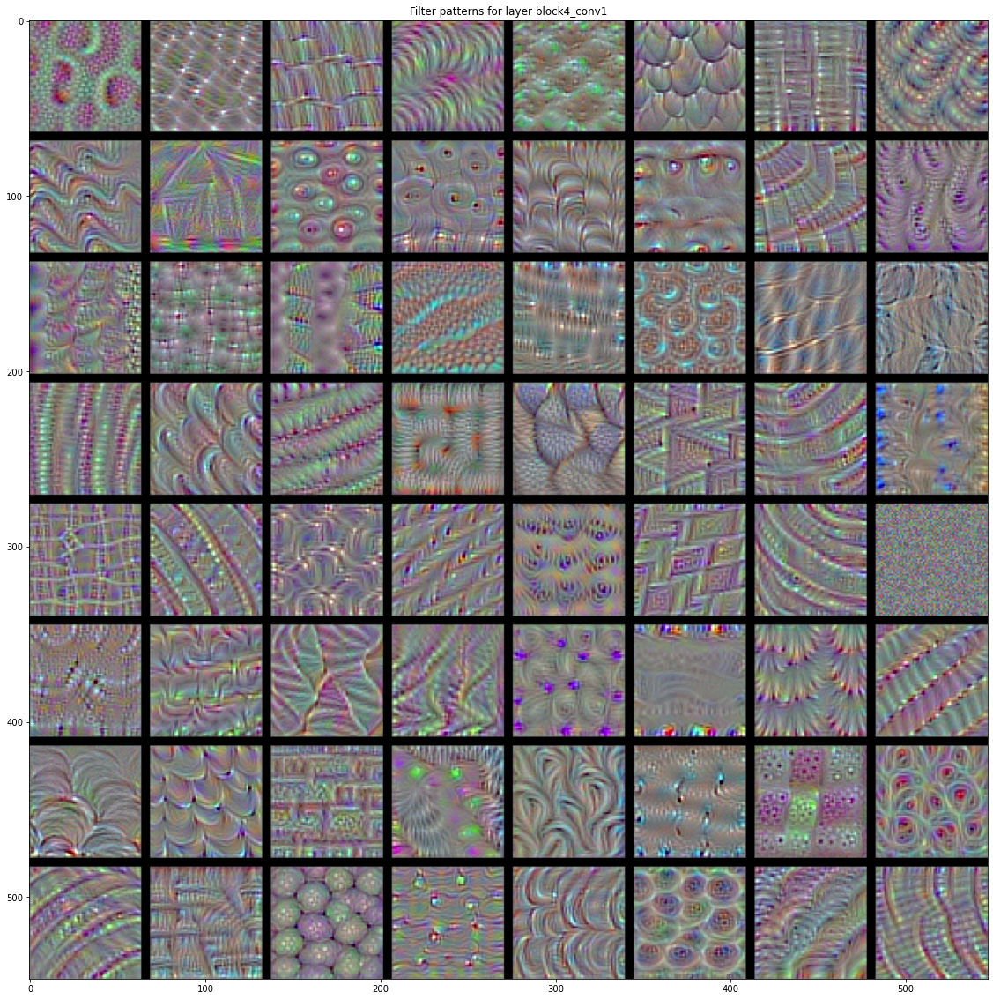

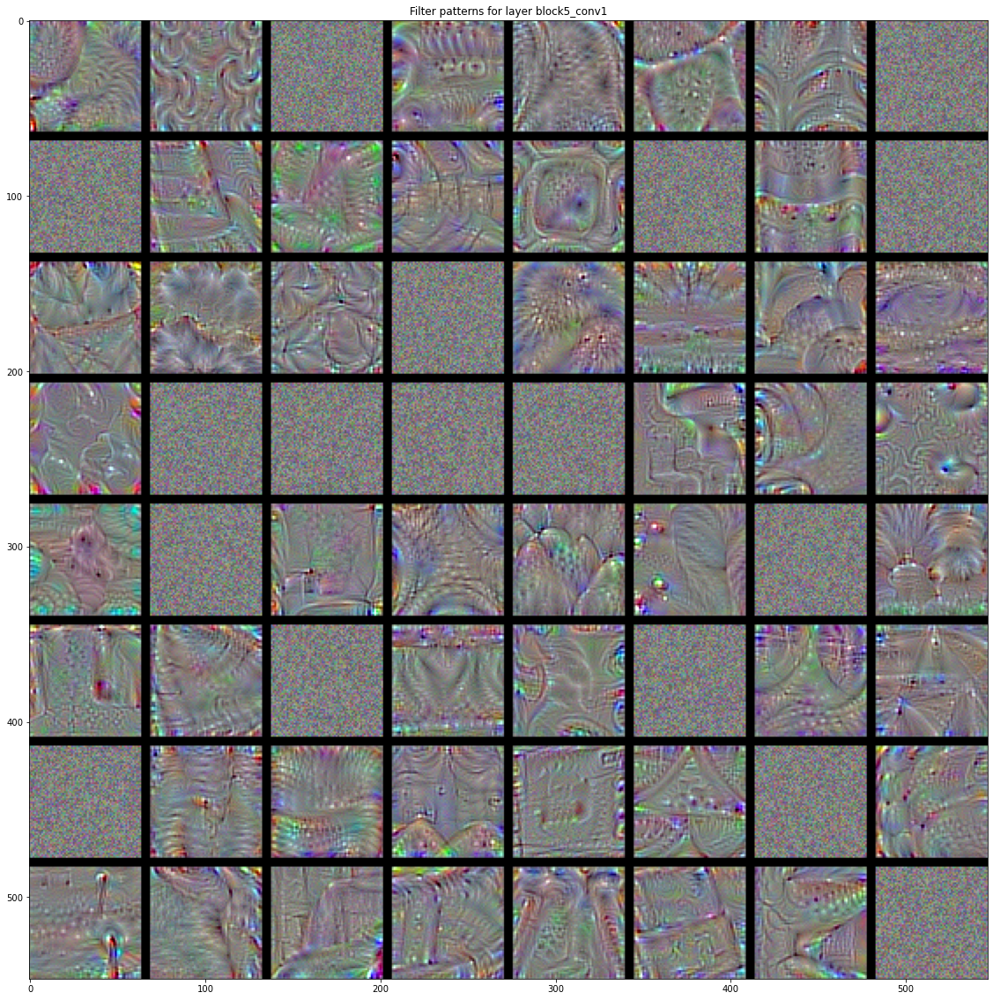

In [ ]:
layers = ['block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
for layer_name in layers:
    plot_filter_patterns(layer_name)